# Load Unlabeled Dataset

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, RobustScaler


sound_data = pd.read_csv('datasets/jre11692500_dataset.csv')
sound_data = sound_data.drop(0)

X = sound_data.drop(['filename', 'label'], axis=1)

Xs = StandardScaler().fit_transform(X)
print(len(Xs))
sound_data.head()

3246


,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
1,jre11692500_1.wav,0.441578,0.031176,2452.753355,2400.318018,5115.332031,0.126144,-353.482391,92.485397,-3.311667,...,-2.363839,-5.873488,2.105093,-7.501835,2.208278,-3.906220,-3.250791,-2.498704,0.930458,jre11692500_
2,jre11692500_10.wav,0.391119,0.049024,2102.894499,2018.743044,3995.107015,0.106585,-298.112457,105.581268,-1.911337,...,-4.300785,-13.941048,0.797238,-8.774372,-1.213172,-6.336737,-4.957156,-6.576495,-1.673529,jre11692500_
3,jre11692500_100.wav,0.428866,0.045402,2333.984810,2293.200629,4721.254476,0.122138,-320.261993,90.473358,-6.332556,...,0.182823,-5.851745,1.892823,-8.513250,-0.875803,-3.156975,1.127327,-8.081711,-0.223936,jre11692500_
4,jre11692500_1000.wav,0.392580,0.078346,2117.510208,1985.690741,4041.263835,0.106025,-212.490799,114.457481,-15.307856,...,1.813047,-9.025507,5.128049,-10.878364,-1.351574,-6.415203,-4.860430,-8.252588,-0.868342,jre11692500_
5,jre11692500_1001.wav,0.469809,0.037327,2239.813927,2191.132913,4524.066162,0.112287,-324.963318,108.212601,-16.467024,...,-0.770890,-7.123728,3.142917,-7.908026,0.713636,-4.640324,-4.185403,-4.470373,4.049245,jre11692500_


# Condense down to 2 dim. (for visualization)

In [65]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=418)

Xe = tsne.fit_transform(Xs)

reduced_data = pd.DataFrame(Xe, columns=['x1', 'x2'])
reduced_data['filename'] = list(sound_data['filename'])

reduced_data.head()

,x1,x2,filename
0,-34.184113,-7.932738,jre11692500_1.wav
1,16.888716,-39.468521,jre11692500_10.wav
2,-3.662650,-20.885347,jre11692500_100.wav
3,29.265226,2.865075,jre11692500_1000.wav
4,-14.977818,-3.412216,jre11692500_1001.wav


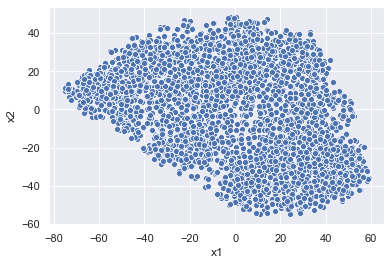

In [66]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

sns.scatterplot(x='x1', y='x2', data=reduced_data)

# Manual Classification

In [4]:
sound_data['label'] = -1

32


In [13]:
sampled_data = sound_data.sample(frac=0.01, random_state=200)
print(len(sampled_data))

32


In [14]:
sampled_filenames = sampled_data['filename']

In [15]:
import librosa
import IPython.display as ipd
from IPython.display import clear_output
from shutil import copyfile
import pathlib

filename = 'jre11692500_'

results = []

pathlib.Path(f'audio/VERIFICATION/{filename}').mkdir(parents=True, exist_ok=True)

for n in list(sampled_filenames):
    
    copyfile(f'audio/{filename}/{n}', f'audio/VERIFICATION/{filename}/{n}')
    audio = f'audio/{filename}/{n}'
    print(f'{audio}')
    ipd.display(ipd.Audio(audio))
    
    result = int(input())
    
    results.append(result)
    clear_output(wait=True)
    

audio/jre11692500_/jre11692500_1886.wav


1


In [16]:
print(results)

[1, -1, 1, -1, 1, 0, 1, 0, 1, -1, -1, -1, -1, 0, 0, 0, 0, 1, 0, 0, 1, -1, -1, -1, -1, -1, 1, 0, 1, 0, -1, 1]


In [17]:
if len(results) == len(sampled_filenames):
    for i, (ix, f) in enumerate(sampled_filenames.items()):
        sound_data.at[ix, 'label'] = results[i]
        print(f'replaced: {f} with {results[i]}')

replaced: jre11692500_2575.wav with 1
replaced: jre11692500_2710.wav with -1
replaced: jre11692500_2992.wav with 1
replaced: jre11692500_2360.wav with -1
replaced: jre11692500_2996.wav with 1
replaced: jre11692500_2914.wav with 0
replaced: jre11692500_1005.wav with 1
replaced: jre11692500_944.wav with 0
replaced: jre11692500_2588.wav with 1
replaced: jre11692500_2257.wav with -1
replaced: jre11692500_562.wav with -1
replaced: jre11692500_2148.wav with -1
replaced: jre11692500_2503.wav with -1
replaced: jre11692500_970.wav with 0
replaced: jre11692500_1568.wav with 0
replaced: jre11692500_1998.wav with 0
replaced: jre11692500_2784.wav with 0
replaced: jre11692500_2463.wav with 1
replaced: jre11692500_2731.wav with 0
replaced: jre11692500_2416.wav with 0
replaced: jre11692500_1265.wav with 1
replaced: jre11692500_1616.wav with -1
replaced: jre11692500_1912.wav with -1
replaced: jre11692500_1377.wav with -1
replaced: jre11692500_1737.wav with -1
replaced: jre11692500_3194.wav with -1
repl

In [18]:
sound_data['label'].value_counts()

-1    3205
 0      21
 1      20
Name: label, dtype: int64

In [27]:
labeled_data = sound_data[sound_data['label'] != -1]

# Recycled Classifying

In [31]:
labeled_X = labeled_data.drop(['filename', 'label'], axis=1)
st_scaler = StandardScaler()
labeledS = st_scaler.fit_transform(labeled_X)

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import RMSprop

model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(labeledS.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam',
             loss='binary_crossentropy',
             metrics = ['accuracy'])

In [33]:
history = model.fit(np.array(labeledS), labeled_data['label'], 
                    epochs=20, 
                    batch_size=24,
                   verbose=2)

Epoch 1/20
2/2 - 0s - loss: 0.6644 - accuracy: 0.4878
Epoch 2/20
2/2 - 0s - loss: 0.6228 - accuracy: 0.4878
Epoch 3/20
2/2 - 0s - loss: 0.5864 - accuracy: 0.4878
Epoch 4/20
2/2 - 0s - loss: 0.5554 - accuracy: 0.5122
Epoch 5/20
2/2 - 0s - loss: 0.5256 - accuracy: 0.5610
Epoch 6/20
2/2 - 0s - loss: 0.5006 - accuracy: 0.5854
Epoch 7/20
2/2 - 0s - loss: 0.4770 - accuracy: 0.6098
Epoch 8/20
2/2 - 0s - loss: 0.4557 - accuracy: 0.7073
Epoch 9/20
2/2 - 0s - loss: 0.4353 - accuracy: 0.8537
Epoch 10/20
2/2 - 0s - loss: 0.4175 - accuracy: 0.9512
Epoch 11/20
2/2 - 0s - loss: 0.3989 - accuracy: 0.9512
Epoch 12/20
2/2 - 0s - loss: 0.3825 - accuracy: 0.9756
Epoch 13/20
2/2 - 0s - loss: 0.3668 - accuracy: 0.9756
Epoch 14/20
2/2 - 0s - loss: 0.3509 - accuracy: 0.9756
Epoch 15/20
2/2 - 0s - loss: 0.3348 - accuracy: 0.9756
Epoch 16/20
2/2 - 0s - loss: 0.3187 - accuracy: 0.9756
Epoch 17/20
2/2 - 0s - loss: 0.3032 - accuracy: 1.0000
Epoch 18/20
2/2 - 0s - loss: 0.2881 - accuracy: 1.0000
Epoch 19/20
2/2 - 0

In [43]:
Xs = st_scaler.transform(X)
predictions = model.predict(Xs)

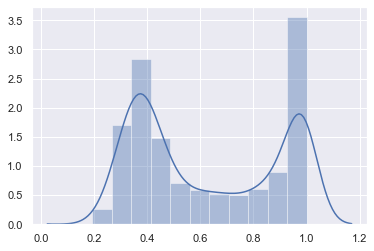

In [46]:
sns.distplot(predictions)

In [83]:
np.quantile(predictions, .9)

0.9925578832626343

In [67]:
reduced_data['prediction'] = predictions

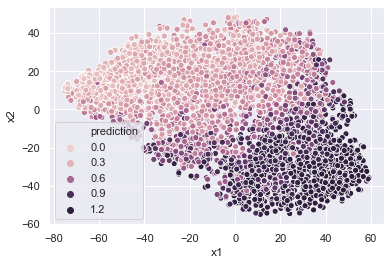

In [69]:
sns.scatterplot(x='x1', y='x2', hue='prediction', data=reduced_data)

In [70]:
def bins(prediction, low, high):
    if prediction < low:
        return 0
    elif prediction > high:
        return 1
    else:
        return -1

In [94]:
labels = reduced_data['prediction'].apply(lambda x: bins(x, np.quantile(predictions, .1), np.quantile(predictions, .9)) )

In [100]:
sound_data['label'] = list(labels)
better_data = sound_data[sound_data['label'] != -1]

In [108]:

randsamp = better_data.sample(frac=0.01)
for n, l in zip(randsamp['filename'], randsamp['label']):
    
    print(l)
    audio = f'audio/{filename}/{n}'
    print(f'{audio}')
    ipd.display(ipd.Audio(audio))

0
audio/jre11692500_/jre11692500_2514.wav


0
audio/jre11692500_/jre11692500_439.wav


0
audio/jre11692500_/jre11692500_693.wav


0
audio/jre11692500_/jre11692500_2784.wav


1
audio/jre11692500_/jre11692500_2430.wav


0
audio/jre11692500_/jre11692500_1843.wav


In [112]:
better_data.to_csv('datasets/jrelabeled650.csv', index=False)

## Applying model again

In [125]:
trainX2 = st_scaler.fit_transform(better_data.drop(['filename', 'label'], axis=1))
trainy2 = better_data['label']

In [126]:
history2 = model.fit(np.array(trainX2), trainy2, 
                    epochs=20, 
                    batch_size=24,
                   verbose=2)

Epoch 1/20
28/28 - 0s - loss: 4.3494e-04 - accuracy: 1.0000
Epoch 2/20
28/28 - 0s - loss: 2.8274e-04 - accuracy: 1.0000
Epoch 3/20
28/28 - 0s - loss: 1.9635e-04 - accuracy: 1.0000
Epoch 4/20
28/28 - 0s - loss: 1.4565e-04 - accuracy: 1.0000
Epoch 5/20
28/28 - 0s - loss: 1.1119e-04 - accuracy: 1.0000
Epoch 6/20
28/28 - 0s - loss: 9.1016e-05 - accuracy: 1.0000
Epoch 7/20
28/28 - 0s - loss: 7.5295e-05 - accuracy: 1.0000
Epoch 8/20
28/28 - 0s - loss: 6.3500e-05 - accuracy: 1.0000
Epoch 9/20
28/28 - 0s - loss: 5.4424e-05 - accuracy: 1.0000
Epoch 10/20
28/28 - 0s - loss: 4.7502e-05 - accuracy: 1.0000
Epoch 11/20
28/28 - 0s - loss: 4.1520e-05 - accuracy: 1.0000
Epoch 12/20
28/28 - 0s - loss: 3.6965e-05 - accuracy: 1.0000
Epoch 13/20
28/28 - 0s - loss: 3.2985e-05 - accuracy: 1.0000
Epoch 14/20
28/28 - 0s - loss: 2.9798e-05 - accuracy: 1.0000
Epoch 15/20
28/28 - 0s - loss: 2.6903e-05 - accuracy: 1.0000
Epoch 16/20
28/28 - 0s - loss: 2.4545e-05 - accuracy: 1.0000
Epoch 17/20
28/28 - 0s - loss: 2.

In [127]:
X2 = st_scaler.transform(X)
predictions2 = model.predict(X2)

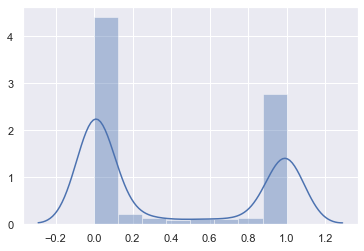

In [129]:
sns.distplot(predictions2)

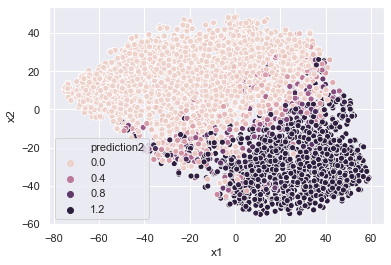

In [130]:
reduced_data['prediction2'] = predictions2
sns.scatterplot(x='x1', y='x2', hue='prediction2', data=reduced_data)

In [140]:
reduced_data.head()

,x1,x2,filename,prediction,prediction2
0,-34.184113,-7.932738,jre11692500_1.wav,0.424550,0.004995
1,16.888716,-39.468521,jre11692500_10.wav,0.966240,0.999079
2,-3.662650,-20.885347,jre11692500_100.wav,0.621981,0.129854
3,29.265226,2.865075,jre11692500_1000.wav,0.890512,0.995656
4,-14.977818,-3.412216,jre11692500_1001.wav,0.417417,0.010558


In [148]:
np.quantile(predictions2, .8)

0.9995909929275513

In [149]:
def bins(prediction, low, high):
    if prediction < low:
        return 0
    elif prediction > high:
        return 1
    else:
        return -1

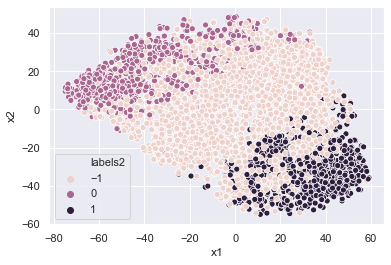

In [156]:
labels2 = reduced_data['prediction2'].apply(lambda x: bins(x, np.quantile(predictions2, .2), np.quantile(predictions2, .8)) )
reduced_data['labels2'] = labels2
sns.scatterplot(x='x1', y='x2', hue='labels2', data=reduced_data)

In [157]:
sound_data['label2'] = list(labels2)
better_data2 = sound_data[sound_data['label2'] != -1]

In [160]:
randsamp = better_data2.sample(frac=0.01)
for n, l in zip(randsamp['filename'], randsamp['label2']):
    
    print(l)
    audio = f'audio/{filename}/{n}'
    print(f'{audio}')
    ipd.display(ipd.Audio(audio))

0
audio/jre11692500_/jre11692500_358.wav


0
audio/jre11692500_/jre11692500_2720.wav


1
audio/jre11692500_/jre11692500_1097.wav


1
audio/jre11692500_/jre11692500_2114.wav


0
audio/jre11692500_/jre11692500_243.wav


1
audio/jre11692500_/jre11692500_295.wav


0
audio/jre11692500_/jre11692500_1831.wav


1
audio/jre11692500_/jre11692500_3179.wav


0
audio/jre11692500_/jre11692500_1846.wav


1
audio/jre11692500_/jre11692500_2583.wav


1
audio/jre11692500_/jre11692500_247.wav


1
audio/jre11692500_/jre11692500_2324.wav


0
audio/jre11692500_/jre11692500_3197.wav


In [161]:
better_data2

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,...,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label,label2
6,jre11692500_1002.wav,0.370643,0.060327,2311.597408,1842.221912,4046.746826,0.141018,-244.242737,101.293144,-26.639498,...,-17.581421,0.219237,-15.416845,-2.527660,-6.503064,-7.859387,-11.159444,-1.384048,1,1
8,jre11692500_1004.wav,0.334566,0.049869,1939.228643,2043.361318,3735.312907,0.081312,-311.681519,95.534386,-9.830963,...,-21.340956,-0.276192,-9.889625,-7.471118,-8.896070,-5.014895,-4.136333,-4.388417,1,1
10,jre11692500_1006.wav,0.349033,0.037965,1853.812744,1790.238071,3456.477865,0.091679,-288.414154,126.246300,-12.794884,...,-12.223885,2.816964,-8.079397,-3.590029,-8.260034,-4.544590,-6.480252,-5.387292,-1,1
11,jre11692500_1007.wav,0.352053,0.048932,2170.699733,1890.509107,3965.598551,0.120795,-289.390564,98.574074,-11.574970,...,-19.094336,1.818855,-9.331707,-2.967143,-12.409453,-6.876427,-4.118853,-3.872151,1,1
13,jre11692500_1009.wav,0.349883,0.048066,1572.637537,1701.640398,2895.817057,0.073938,-297.128540,137.961060,-21.671207,...,-10.068391,1.245310,-10.639617,-0.519561,-4.097899,-4.806003,-8.309758,0.091142,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3239,jre11692500_992.wav,0.355399,0.059508,1677.434168,1895.513608,3361.173503,0.068436,-290.614471,114.280266,-17.769346,...,-15.562260,-1.995935,-10.060414,-5.478436,-10.900114,-5.465006,-10.018593,-10.128694,1,1
3240,jre11692500_993.wav,0.424855,0.038565,1941.872672,1798.981149,3530.049642,0.113331,-292.738495,131.493546,-22.306425,...,-9.512214,1.419463,-11.874687,-2.957592,-8.703974,-8.307839,-9.466793,-3.559129,1,1
3241,jre11692500_994.wav,0.402684,0.025351,1884.275733,2061.173461,3907.578532,0.077845,-389.370056,126.664970,-3.197183,...,-9.734351,-3.302682,-10.545073,-2.052598,-7.436944,-5.809814,-6.804419,-5.509882,-1,1
3242,jre11692500_995.wav,0.356650,0.047945,1875.206792,2011.394776,3719.262695,0.086955,-325.677155,111.947113,-19.987749,...,-11.072523,3.140289,-9.441021,-2.043447,-7.869081,-3.900815,-5.934636,-5.424959,-1,1


In [162]:
better_data2.to_csv('datasets/jrelabeled1298.csv', index=False)